# OpenCV를 활용한 영상정보 전처리(4)

# 이미지에 선, 사각형, 원, Text 그리기

In [2]:
# 필요한 모듈 읽어오기

import cv2
from google.colab.patches import cv2_imshow

In [ ]:
# OpenCV 버전을 확인한다.

print("OpenCV version:")
print(cv2.__version__)

OpenCV version:
4.6.0


In [3]:
# 내 구글 드라이버에 연동

from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
# 이미지를 읽어 온다.

img = cv2.imread('gdrive/My Drive/CV/Basic Vision Skills/images/rear_garden.PNG', cv2.IMREAD_COLOR)
print(img.shape)                                   # 형상 - (496, 819, 3)
print("width: {} pixels".format(img.shape[1]))     # 넓이
print("height: {} pixels".format(img.shape[0]))    # 높이
print("channels: {}".format(img.shape[2]))         # 채널

(496, 819, 3)
width: 819 pixels
height: 496 pixels
channels: 3


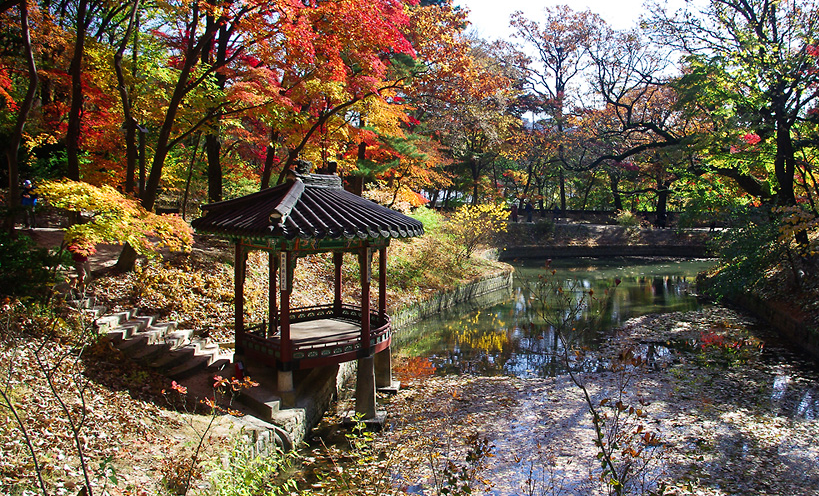

In [ ]:
# 원본 이미지를 화면에 출력
cv2_imshow(img)

In [5]:
# 색상을 정할 때 OpenCV 이미지의 기본 채널 순서는 파랑-녹색-빨강(BGR) 방식을 사용한다.

# 이미지의 특정 위치 = 픽셀(Pixel), Pixel(BGR)
(b, g, r) = img[0, 1]
print("Pixel at (0, 0) - Red: {}, Green: {}, Blue: {}".format(r, g, b))

Pixel at (0, 0) - Red: 12, Green: 20, Blue: 5


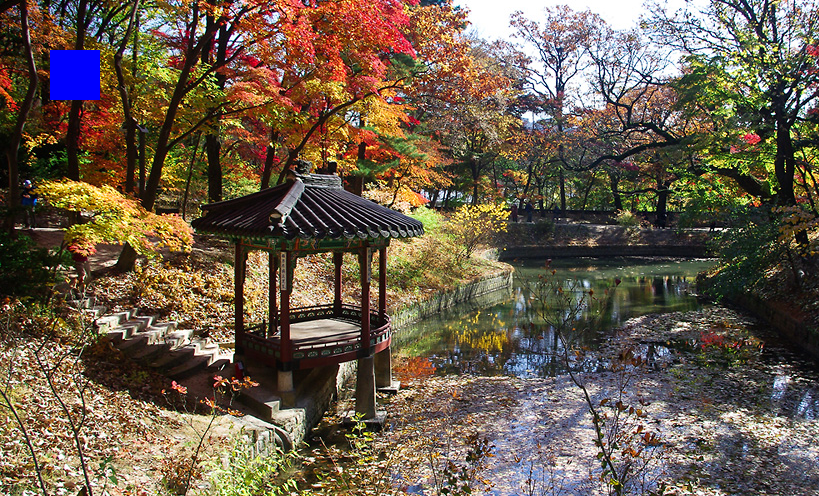

In [6]:
# 이미지 내에서 특정한 범위만 지정하여 파란 색상으로 변경한다.
img[50:100, 50:100] = (255, 0, 0)
cv2_imshow(img)                    # 변경 이미지 출력

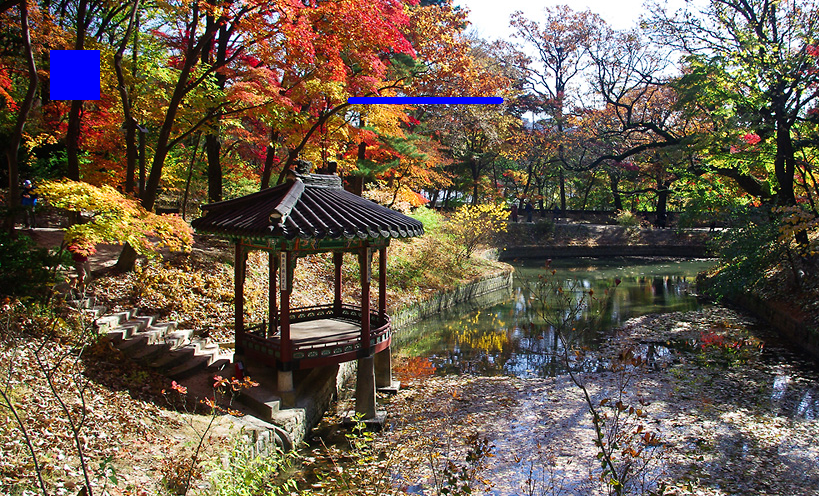

In [7]:
# cv2.line(이미지, 시작지점 좌표, 끝지점 좌표, 색상, 굵기, 선의 종류, 좌표 시프트)

# 이미지에 선을 그린다.
cv2.line(img, (350, 100), (500, 100), (255, 0, 0), 5)    # (원본이미지, 시작점, 끝점, 색상, 선굵기)
cv2_imshow(img)                                          # 이미지 출력

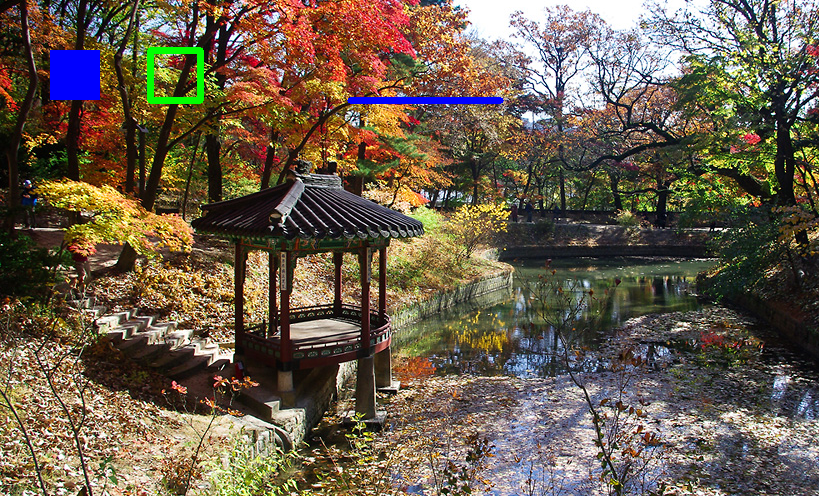

In [8]:
# cv2.rectangle(이미지, 시작점 좌표, 종료점 좌료, 색상, 선 두께, 선 종류, 좌표 시프트)

# 이미지에 사각형을 그린다.
cv2.rectangle(img, (150, 50), (200, 100), (0, 255, 0), 5)  # (원본이미지, 시작점 좌표, 끝점 좌표, 색상, 선굵기)
cv2_imshow(img)                                            # 이미지 출력

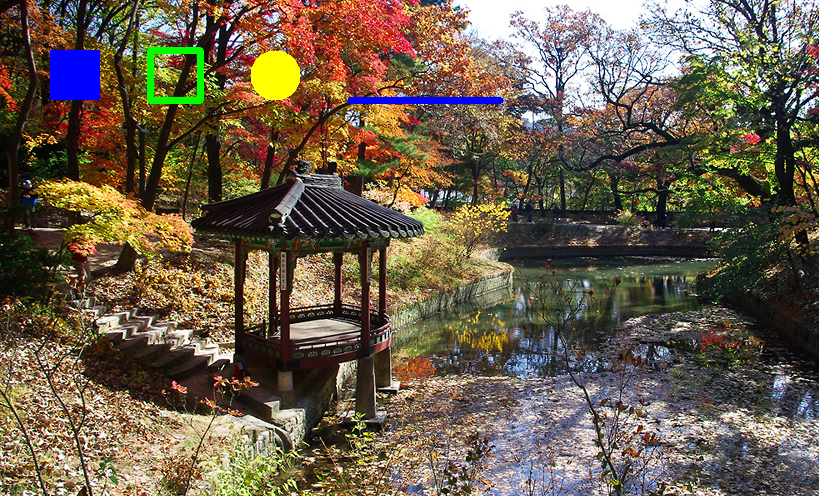

In [9]:
# cv2.circle()

# 이미지에 원을 그린다.
cv2.circle(img, (275, 75), 25, (0, 255, 255), -1)  # (원본 이미지, 중심점, 반지름, 색상, -1은 도형전체를 채움)
cv2_imshow(img)                                    # 이미지 출력

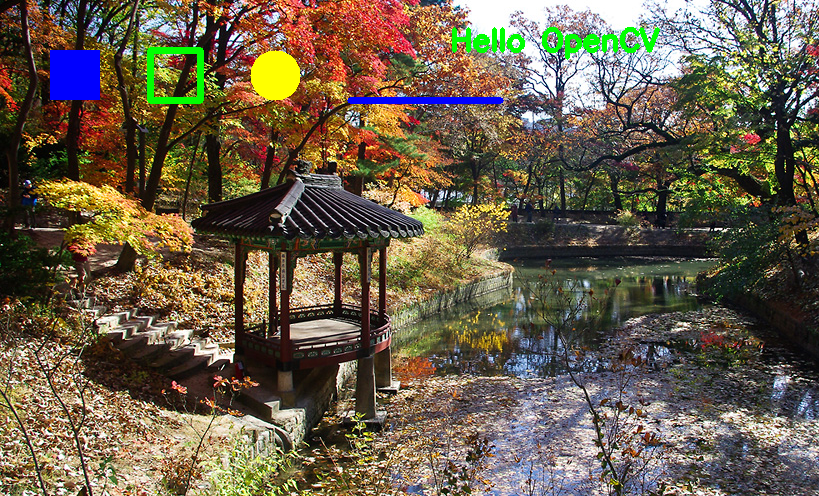

In [10]:
# cv2.putText(원본 이미지, 입력글, 시작점, 폰트, 폰트크기, 폰트색상, 폰트굵기)

# 이미지에 TEXT을 씁니다.
cv2.putText(img, 'Hello OpenCV', (450, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 4)  # (원본 이미지, 입력글, 시작점, 폰트, 폰트크기, 폰트색상, 폰트굵기)
cv2_imshow(img)                                                                           # 이미지 출력

### 이미지에 한글을 출력하고 폰트에 투명도를 적용시켜 화면에 출력해 보자.

In [11]:
# 필요한 라이브러리를 불러오기

import numpy as np
from PIL import ImageFont, ImageDraw, Image

In [14]:
# BGR to RGBA 이미지 변환

print(img.size)                                  # size = 1218672 = 496 * 819 * 3
print(img.shape)                                 # 형상 - (496, 819, 3)
base_img = Image.fromarray(img).convert('RGBA')  # BGR ==> RGBA 변환
print(base_img.size)                             # (819, 496)

1218672
(496, 819, 3)
(819, 496)


In [15]:
# 한글 폰트를 설정한다.
fontpath = "gdrive/My Drive/CV/Basic Vision Skills/fonts/HYTBRB.TTF"    # 폰트 경로
font = ImageFont.truetype(fontpath, 70)                                 # 폰트, 폰트크기 지정

In [16]:
# 텍스트를 작성할 blank 이미지를 하나 만든다.
txt_img = Image.new('RGBA', base_img.size, (255,255,255,0))

draw = ImageDraw.Draw(txt_img)       # blank 이미지에 텍스트를 넣기 위해 drow 인스턴스를 만든다
draw.text((200, 150), "컴퓨터비전", font=font, fill=(255,255,255,0))   # alpha 완전투명
draw.text((200, 250), "컴퓨터비전", font=font, fill=(255,255,255,128)) # alpha 반투명
draw.text((200, 350), "컴퓨터비전", font=font, fill=(255,255,255,255)) # alpha 불투명

<class 'PIL.Image.Image'>
<class 'numpy.ndarray'>
(496, 819, 4)


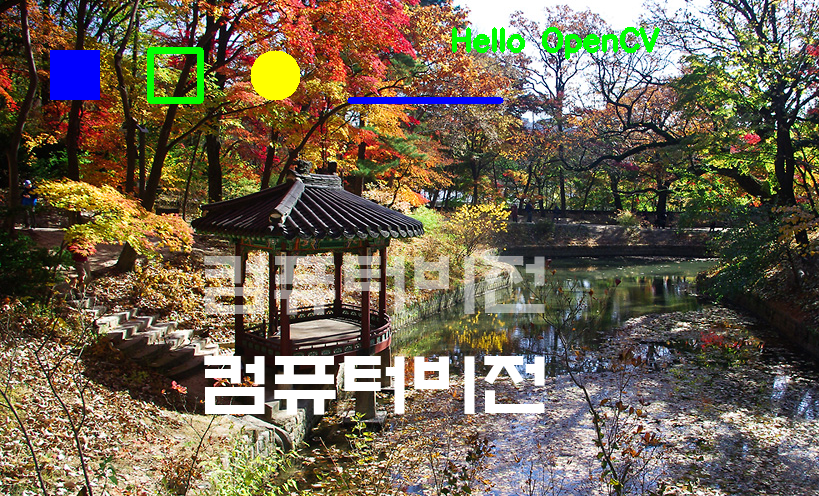

In [20]:
comp_img = Image.alpha_composite(base_img,txt_img)                     # base_img 와 txt_img 을 합친다.
print(type(comp_img))                                                  # <class 'PIL.Image.Image'>
img = np.array(comp_img)                                               # 배열 자료형으로 변환
print(type(img))                                                       # <class 'numpy.ndarray'>
print(img.shape)                                                       # 형상 - (496, 819, 4)
cv2_imshow(img)                                                        # 이미지 출력